Author: Nicolas Legrand <nicolas.legrand@cfin.au.dk>

In [198]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import norm
import seaborn as sns
import numpy as np
from metadPy import sdt
from metadPy.utils import trials2counts, discreteRatings
from metadPy.plotting import plot_confidence
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from systole.detection import oxi_peaks

# Heart Rate Discrimination task - Summary results

This notebook introduces basic analysis steps, plots and quality check for the **Heart Rate Discrimination task**. The current version use data from a young and healthy participant tested with the default task parameters implemented in the `launcher.py` file (80 trials per condition, 30 using a 1-Up/1-Down staircase and 50 using the Psi method.

The `path` variable can be adapted to load new data. The target directory should include the following files output by the task: `final.txt`, containing the behavioural data, `Intero_posterior.npy` and `Extero_posterior.npy`, containing the posterior estimates and `signal.txt` for the PPG signal time series.

You can also use this notebook as a template to generate individual reports of groups of participants (see `reports.py`).

For group-level summary statistics, please refer to `HRDgroupLevel.ipynb`.

**Import data**

In [199]:
path = 'C:\\Users\\c3343721\\Google Drive\\PhD\\MyCode\\Heartrate\\Code\\data\\'
subject='JJ'
folder = 'HRD_JJ_Task_2021_Mar_02_1549'

#subject='Subject_02'
#folder='Subject_02Test'

In [200]:
resultsFiles = os.listdir(os.path.join(path, folder))

In [215]:
# Logs dataframe
df = pd.read_csv(os.path.join(path, folder, [file for file in resultsFiles if file.endswith('final.txt')][0]))

# History of posteriors distribution
interoPost = np.load(os.path.join(path, folder, [file for file in resultsFiles if file.endswith('Intero_posterior.npy')][0]))
exteroPost = np.load(os.path.join(path, folder, [file for file in resultsFiles if file.endswith('Extero_posterior.npy')][0]))

# PPG signal
signal_df = pd.read_csv(os.path.join(path, folder, [file for file in resultsFiles if file.endswith('signal.txt')][0]))
signal_df['Time'] = np.arange(0, len(signal_df))/1000 # Create time vector

In [216]:
os.getcwd()

'C:\\Users\\c3343721\\Google Drive\\PhD\\MyCode\\Heartrate\\Code'

In [217]:
df_old=df
df = df[df.RatingProvided == 1]

In [218]:
this_df = df[df.Modality=='Intero']
sum(this_df.TrialType == 'psi'), sum(this_df.TrialType == 'CatchTrial'), sum(this_df.TrialType == 'UpDown')

(29, 6, 0)

# Response time

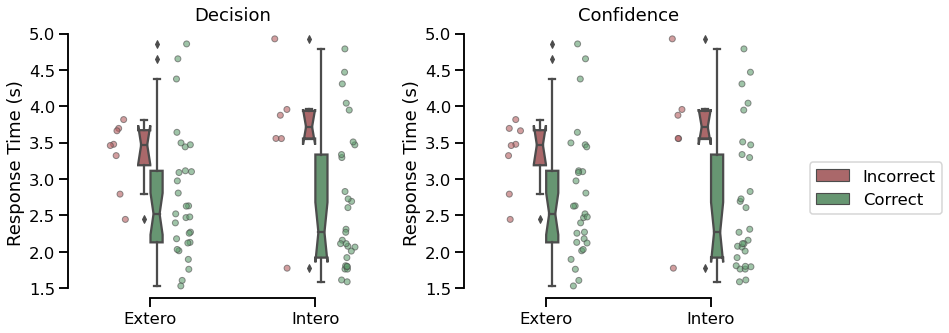

In [219]:
sns.set_context('talk')
palette = ['#b55d60', '#5f9e6e']

fig, axs = plt.subplots(1, 2, figsize=(13, 5))
for i, task, title in zip([0, 1], ['DecisionRT', 'ConfidenceRT'], ['Decision', 'Confidence']):
    sns.boxplot(data=df, x='Modality', y='DecisionRT', hue='ResponseCorrect',
                palette=palette, width=.15, notch=True, ax=axs[i])
    sns.stripplot(data=df, x='Modality', y='DecisionRT', hue='ResponseCorrect',
                  dodge=True, linewidth=1, size=6, palette=palette, alpha=.6, ax=axs[i])
    axs[i].set_title(title)
    axs[i].set_ylabel('Response Time (s)')
    axs[i].set_xlabel('')
    axs[i].get_legend().remove()
sns.despine(trim=10)

handles, labels = axs[0].get_legend_handles_labels()
plt.legend(handles[0:2], ['Incorrect', 'Correct'], bbox_to_anchor=(1.05, .5), loc=2, borderaxespad=0.)

Response time distribution for the decision and the confidence rating phases for correct (red) and incorrect (green) responses.

# Metacognition

# SDT estimate for decision 1 perforamces (d' and criterion)

In [220]:
for i, cond in enumerate(['Intero', 'Extero']):
    this_df = df[df.Modality == cond].copy()
    this_df['Stimuli'] = (this_df.responseBPM > this_df.listenBPM)
    this_df['Responses'] = (this_df.Decision == 'More')

    hits, misses, fas, crs = sdt.scores(data=this_df)
    hr, far = sdt.rates(data=this_df,hits=hits, misses=misses, fas=fas, crs=crs)
    d, c = sdt.dprime(data=this_df,hit_rate=hr, fa_rate=far), sdt.criterion(data=this_df,hit_rate=hr, fa_rate=far)
    
    print(f'Condition: {cond} - d-prime: {d} - criterion: {c}')

Condition: Intero - d-prime: 2.1677605451322473 - criterion: -0.4502402717864226
Condition: Extero - d-prime: 1.5693060541466872 - criterion: -0.019943353286956567


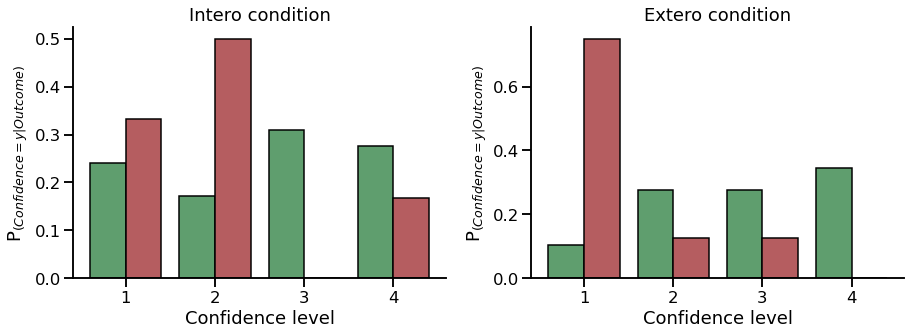

In [221]:
sns.set_context('talk')
fig, axs = plt.subplots(1, 2, figsize=(13, 5))

for i, cond in enumerate(['Intero', 'Extero']):
    this_df = df[df.Modality == cond]
    this_df = this_df[~this_df.Confidence.isnull()]
    new_confidence, _ = discreteRatings(this_df.Confidence)
    this_df['Confidence'] = new_confidence
    this_df['Stimuli'] = (this_df.Alpha > 0).astype('int')
    this_df['Responses'] = (this_df.Decision == 'More').astype('int')
    nR_S1, nR_S2 = trials2counts(data=this_df)
    plot_confidence(nR_S1, nR_S2, ax=axs[i])
    axs[i].set_title(f'{cond} condition')
sns.despine()
plt.tight_layout()

Distribution of confidence ratings for correct (green) and incorrect (red) trials. Overlapping distribution suggests that the subjective confidence in the decision was not predictive of decision performances.

## Type 2 psychometric function

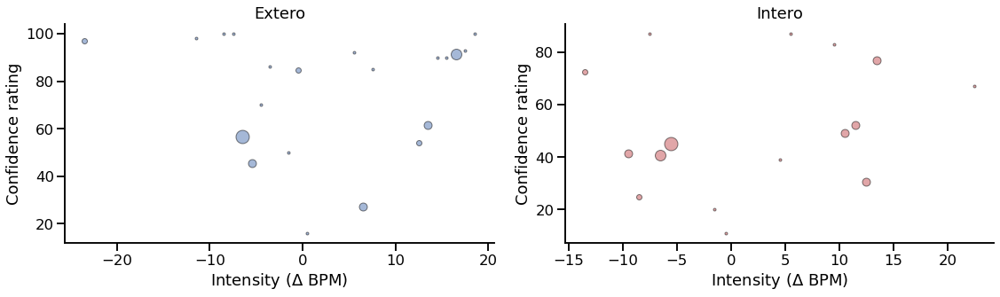

In [222]:
sns.set_context('talk')
fig, axs = plt.subplots(1, 2, figsize=(16, 5))
for i, modality, col in zip((0, 1), ['Extero', 'Intero'], ['#4c72b0', '#c44e52']):
    
    this_df = df[df.Modality == modality]
    
    # Plot data points
    for ii, intensity in enumerate(np.sort(this_df.Alpha.unique())):
        conf = this_df.Confidence[(this_df.Alpha == intensity)].mean()
        total = sum(this_df.Alpha == intensity)
        axs[i].plot(intensity, conf, 'o', alpha=0.5, color=col, markeredgecolor='k', markersize=total*3)
        axs[i].set_title(modality)
        axs[i].set_ylabel('Confidence rating')
        axs[i].set_xlabel('Intensity ($\Delta$ BPM)')
plt.tight_layout()
sns.despine()

# Psychophysics

Distribution of the intensities values tested by each staircases (Intero and Extero).

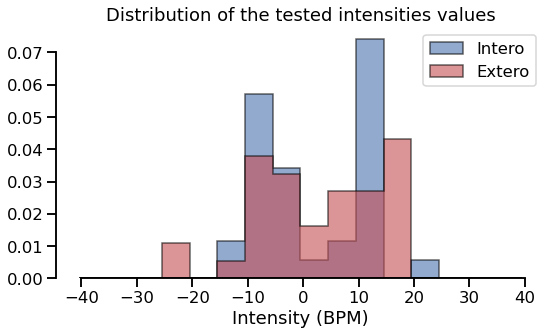

In [223]:
sns.set_context('talk')
fig, axs = plt.subplots(1, 1, figsize=(8, 5))

for cond, col in zip(['Intero', 'Extero'], ['#4c72b0', '#c44e52']):
    this_df = df[df.Modality == cond]
    axs.hist(this_df.Alpha, color=col, bins=np.arange(-40.5, 40.5, 5), histtype='stepfilled',
             ec="k", density=True, align='mid', label=cond, alpha=.6)
axs.set_title('Distribution of the tested intensities values')
axs.set_xlabel('Intensity (BPM)')
plt.legend()
sns.despine(trim=10)
plt.tight_layout()

## Threshold

### Up/Down stairecases

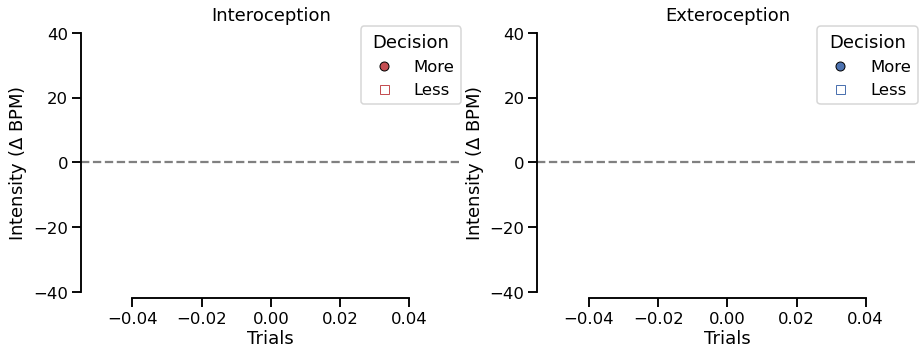

In [224]:
fig, axs = plt.subplots(figsize=(15, 5), nrows=1, ncols=2)
sns.set_context('talk')

# Staircase traces
for i, cond, col in zip([0, 1], ['Intero', 'Extero'], ['#c44e52', '#4c72b0']):
    this_df = df[(df.Modality == cond) & (df.TrialType == 'UpDown')]

    axs[i].plot(np.arange(0, len(this_df))[this_df.StairCond == 'high'], 
                    this_df.Alpha[this_df.StairCond == 'high'], linestyle='--', color=col, linewidth=2)
    axs[i].plot(np.arange(0, len(this_df))[this_df.StairCond == 'low'], 
                    this_df.Alpha[this_df.StairCond == 'low'], linestyle='-', color=col, linewidth=2)
    
    axs[i].plot(np.arange(0, len(this_df))[this_df.Decision == 'More'], 
                    this_df.Alpha[this_df.Decision == 'More'], col, marker='o', linestyle='', markeredgecolor='k', label=cond)
    axs[i].plot(np.arange(0, len(this_df))[this_df.Decision == 'Less'], 
                    this_df.Alpha[this_df.Decision == 'Less'], 'w', marker='s', linestyle='', markeredgecolor=col, label=cond)

    axs[i].axhline(y=0, linestyle='--', color = 'gray')
    handles, labels = axs[i].get_legend_handles_labels()
    axs[i].legend(handles[0:2], ['More', 'Less'], borderaxespad=0., title='Decision')
    axs[i].set_ylabel('Intensity ($\Delta$ BPM)')
    axs[i].set_xlabel('Trials')
    axs[i].set_ylim(-42, 42)
    axs[i].set_title(cond+'ception')
    sns.despine(trim=10, ax=axs[i])
    plt.gcf()

### Psi

In [247]:
interoPost.shape

(32, 102, 250)

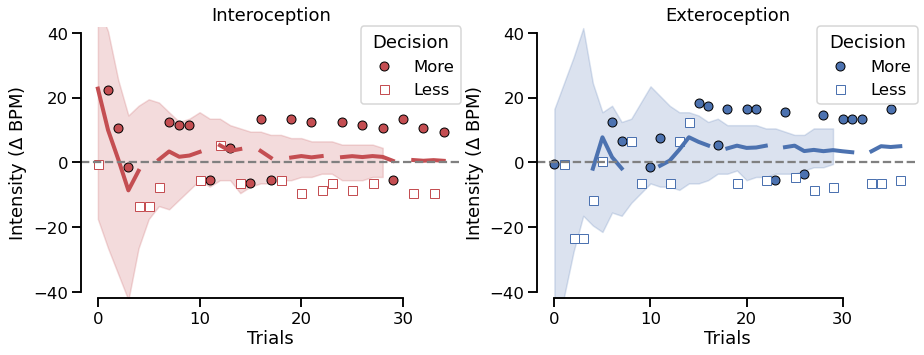

In [248]:
fig, axs = plt.subplots(figsize=(15, 5), nrows=1, ncols=2)
sns.set_context('talk')

# Plot confidence interval for each staircase
def ci(x):
    return np.where(np.cumsum(x) / np.sum(x) > .025)[0][0], \
           np.where(np.cumsum(x) / np.sum(x) < .975)[0][-1]

for i,cond, stair, col in zip([0, 1], ['Intero', 'Extero'], [interoPost, exteroPost], ['#c44e52', '#4c72b0']):
    this_df=df[(df.Modality==cond) & (df.TrialType == 'psi')] #excludes catchTrials 
    this_df_old=df_old[(df_old.Modality == cond) & (df_old.TrialType == 'psi')] #excludes catchTrials but includes missing
    nonMissingIndices=np.where(this_df_old['RatingProvided'] )[0] #indices of trials (in df_old) with Rating Provided
    stair_nonMissing=stair[nonMissingIndices,:,:]
    """
    print('i col:',i,col)
    print('this_df.shape',this_df.shape)
    print('this_df_old.shape',this_df_old.shape)
    print('stair old',stair.shape[0])
    print('stair new',stair_nonMissing.shape[0])
    """
    ciUp, ciLow = [], []
    for t in range(stair_nonMissing.shape[0]):
        #print(t)
        up, low = ci(stair_nonMissing.mean(2)[t])
        ciUp.append(np.arange(-50.5, 50.5)[up])
        ciLow.append(np.arange(-50.5, 50.5)[low])
    axs[i].fill_between(x=np.arange(len(this_df)),
                        y1=ciLow,
                        y2=ciUp,
                        color=col, alpha=.2)

# Staircase traces
for i, cond, col in zip([0, 1], ['Intero', 'Extero'], ['#c44e52', '#4c72b0']):
    this_df = df[(df.Modality == cond) & (df.TrialType != 'UpDown')]

    # Show UpDown staircase traces
    axs[i].plot(np.arange(0, len(this_df))[this_df.StairCond == 'high'], 
                    this_df.Alpha[this_df.StairCond == 'high'], linestyle='--', color=col, linewidth=2)
    axs[i].plot(np.arange(0, len(this_df))[this_df.StairCond == 'low'], 
                    this_df.Alpha[this_df.StairCond == 'low'], linestyle='-', color=col, linewidth=2)

    axs[i].plot(np.arange(0, len(this_df))[this_df.Decision == 'More'], 
                    this_df.Alpha[this_df.Decision == 'More'], col, marker='o', linestyle='', markeredgecolor='k', label=cond)
    axs[i].plot(np.arange(0, len(this_df))[this_df.Decision == 'Less'], 
                    this_df.Alpha[this_df.Decision == 'Less'], 'w', marker='s', linestyle='', markeredgecolor=col, label=cond)

    # Trheshold estimate
    axs[i].plot(np.arange(sum(this_df.StairCond != 'psi'), len(this_df)), this_df[this_df.StairCond == 'psi'].EstimatedThreshold, linestyle='-', color=col, linewidth=4)
    axs[i].plot(np.arange(0, sum(this_df.StairCond != 'psi')), this_df[this_df.StairCond != 'psi'].EstimatedThreshold, linestyle='--', color=col, linewidth=2, alpha=.3)

    axs[i].axhline(y=0, linestyle='--', color = 'gray')
    handles, labels = axs[i].get_legend_handles_labels()
    axs[i].legend(handles[0:2], ['More', 'Less'], borderaxespad=0., title='Decision')
    axs[i].set_ylabel('Intensity ($\Delta$ BPM)')
    axs[i].set_xlabel('Trials')
    axs[i].set_ylim(-42, 42)
    axs[i].set_title(cond+'ception')
    sns.despine(trim=10, ax=axs[i])
    plt.gcf()

This figure represents the evolution of threshold estimate across trials for the Interoception and Exteroception condition. Shaded areas represent the 95% confidence interval of the threshold estimate by Psi. For each condition, the first 30 trials (connected with dashed lines) were allocated to an Up/Down method (2 interleaved staircases starting a -40.5 or 40 respectively). The intensities and responses were included in the Psi staircase to maximize the amount of information included. The remaining 50 trials were monitored by the Psi staircase only. This dual estimation was implemented to estimate the reliability of the estimation of threshold using an up/down procedure, as compared to a longer psi procedure.

## Psychometric function

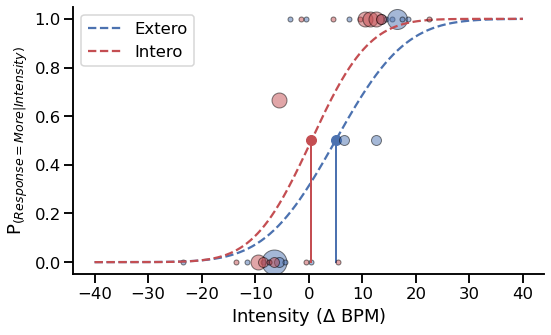

In [34]:
sns.set_context('talk')
fig, axs = plt.subplots(figsize=(8, 5))
for i, modality, col in zip((0, 1), ['Extero', 'Intero'], ['#4c72b0', '#c44e52']):
    
    this_df = df[(df.Modality == modality) & (df.TrialType == 'psi')]

    t, s = this_df.EstimatedThreshold.iloc[-1], this_df.EstimatedSlope.iloc[-1]
    # Plot Psi estimate of psychometric function
    axs.plot(np.linspace(-40, 40, 500), 
            (norm.cdf(np.linspace(-40, 40, 500), loc=t, scale=s)),
            '--', color=col, label=modality)
    # Plot threshold
    axs.plot([t, t], [0, .5], color=col, linewidth=2)
    axs.plot(t, .5, 'o', color=col, markersize=10)

    # Plot data points
    for ii, intensity in enumerate(np.sort(this_df.Alpha.unique())):
        resp = sum((this_df.Alpha == intensity) & (this_df.Decision == 'More'))
        total = sum(this_df.Alpha == intensity)
        axs.plot(intensity, resp/total, 'o', alpha=0.5, color=col, markeredgecolor='k', markersize=total*5)
plt.ylabel('P$_{(Response = More|Intensity)}$')
plt.xlabel('Intensity ($\Delta$ BPM)')
plt.tight_layout()
plt.legend()
sns.despine()

Psychometric curves fitted using the estimated threshod and slope from the psi staircase after 80 trials for each condition. We only keeped the value estimated in the last trial. The size of the circles reflect the proportion of trial for each intensity level.

# Pulse oximeter

## Interactive visualization of PPG signal

This interactive graph show the PPG signal recorded at each interoceptive trial. Blue and red time series represent different trials of 6 seconds each. The 5 last seconds were used to estimate the average heart rate of the participant, the first second was included to help peak detection algorithm initialization.

In [35]:
meanBPM, stdBPM, rangeBPM = [], [], []

fig = go.Figure()
for i, trial in enumerate(signal_df.nTrial.unique()):
    color = '#c44e52' if (i % 2) == 0 else '#4c72b0'
    this_df = signal_df[signal_df.nTrial==trial]
    fig.add_trace(go.Scattergl(x=this_df.Time, y=this_df.signal, mode='lines', name='PPG',
                               hoverinfo='skip', showlegend=False,
                               line=dict(width=1, color=color)))
    # Peaks detection
    signal, peaks = oxi_peaks(this_df.signal, sfreq=1000)
    bpm = 60000/np.diff(np.where(peaks[-5000:])[0])
    m, s, r = bpm.mean(), bpm.std(), bpm.max() - bpm.min()
    meanBPM.append(m)
    stdBPM.append(s)
    rangeBPM.append(r)
fig.update_layout(xaxis_title="Time (s)", yaxis_title="PPG signal (au)")
fig.update_xaxes(rangeslider_visible=True)
fig.show()

## Heart rate - Summary statistics

This figure show the evolution of the average and standard deviation of the instantaneous heart rate across time. An instantaneous frequnecy was derived between each peak detected in the PPG signal (also known as pulse-to-pulse intervals, or pseudo RR intervals). Rapid increase or decrease of the heart rate frequency can lead to larger standard deviation, and less accurate estimation of the average heart rate.

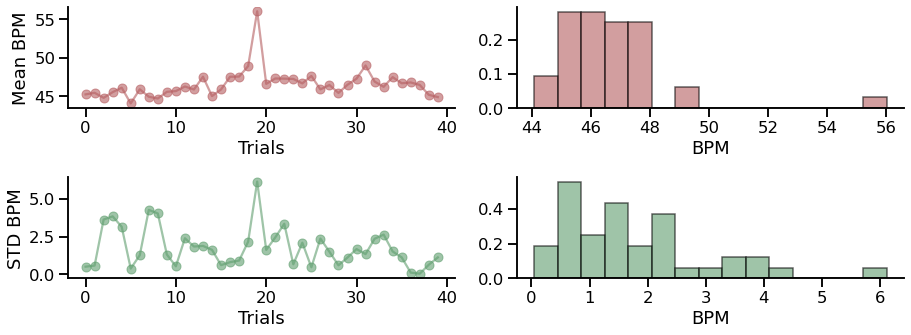

In [36]:
sns.set_context('talk')
fig, axs = plt.subplots(figsize=(13, 5), nrows=2, ncols=2)
for i, metric, col in zip(range(3), [meanBPM, stdBPM], ['#b55d60', '#5f9e6e']):
    axs[i, 0].plot(metric, 'o-', color=col, alpha=.6)
    axs[i, 1].hist(metric, color=col, bins=15, ec="k", density=True, alpha=.6)
    axs[i, 0].set_ylabel('Mean BPM' if i == 0 else 'STD BPM')
    axs[i, 0].set_xlabel('Trials')
    axs[i, 1].set_xlabel('BPM')
sns.despine()
plt.tight_layout()

# Evoked pulse rate deceleration

Here, we have to retrieve stimli timing from the behavior dataframe and back ropagate it on the PPG time series.

In [37]:
from systole.detection import oxi_peaks, rr_artefacts
from systole.correction import correct_peaks
from systole.utils import heart_rate, to_epochs
from systole.plotting import plot_subspaces
from scipy.stats import spearmanr
from scipy.interpolate import interp1d

IN THE FOLLOWING, make sure range includes all JJXX.npy files!!!

In [64]:
this_df = df.copy()

In [65]:
epoch_df = pd.DataFrame([])
for i in np.arange(20, 80, 20):
    print("this is ", i)
    ppg=  np.load(os.path.join(path, folder, [file for file in resultsFiles if file.endswith(f'{str(i)}.npy')][0]))[0]
    signal, peaks = oxi_peaks(ppg)
    
    # Trim PPG signal
    trimLength = int(this_df[this_df.nTrials <= i].RatingEnds.iloc[-1] - this_df[this_df.nTrials <= i].StartListening.iloc[0] * 1000)
    ppg = ppg[-trimLength:]

    # Create trigger vector
    startIdx = (np.around((this_df[this_df.nTrials <= i].StartListening - this_df[this_df.nTrials <= i].StartListening.iloc[0]).to_numpy(), 3) * 1000).astype('int')
    trigger = np.zeros(len(signal), dtype='int')
    trigger[startIdx] = 1
    
    # Extract instantaneous heartrate
    hr, time = heart_rate(peaks, sfreq=1000, unit='bpm', kind='previous')
    
    # Epoch
    epoch = to_epochs(hr, trigger, sfreq=1000, event_val=1, tmin=-1, tmax=5, apply_baseline=(-1, 0))

    intero_df = epoch_df.append(pd.DataFrame(epoch[this_df[this_df.nTrials <= i].Modality == 'Intero', ::250]).melt())
    extero_df = epoch_df.append(pd.DataFrame(epoch[this_df[this_df.nTrials <= i].Modality == 'Extero', ::250]).melt())

    this_df = this_df[this_df.nTrials > i]

intero_df.variable /= 4
intero_df.variable -= 1

extero_df.variable /= 4
extero_df.variable -= 1

this is  20
this is  40
this is  60


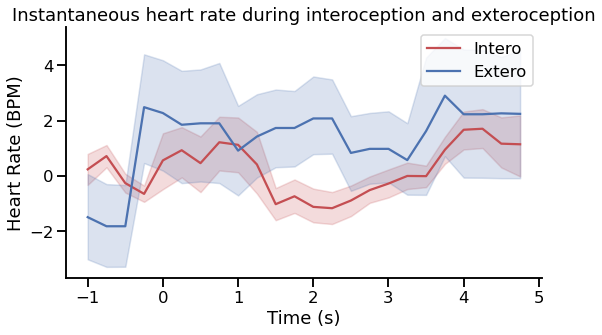

In [66]:
sns.set_context('talk')
fig, ax = plt.subplots(figsize=(8, 5))
sns.lineplot(data=intero_df, x='variable', y='value', ci=68, label='Intero',
             color='#c44e52', ax=ax)
sns.lineplot(data=extero_df, x='variable', y='value', ci=68, label='Extero',
             color='#4c72b0', ax=ax)
#ax.set_xlim(-1, 5)
ax.set_xlabel('Time (s)')
ax.set_ylabel('Heart Rate (BPM)')
ax.set_title('Instantaneous heart rate during interoception and exteroception')
sns.despine()
plt.tight_layout()

In [67]:
i = 40
ppg = np.load(os.path.join(path, folder, [file for file in resultsFiles if file.endswith(f'{str(i)}.npy')][0]))[0]

# Interpolate HR to 1000 Hz

trialppg = signal_df[signal_df.nTrial == 0].signal.to_numpy()
rtot = []
for i in range(1000):
    signal, peaks = oxi_peaks(ppg[i:i+75*6])
    r, p = spearmanr(signal, trialppg)
    rtot.append(r)

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 0, the array at index 0 has size 6000 and the array at index 1 has size 0

In [ ]:
def extract_epochs(signal, triggers, valence, arousal, learningTime, nSub, tmin, tmax, draw_figure=False, figure_name=None):
    """This function will find peaks in signal, reject artefacts and epoch the raw data.
    If draw_figure is True, will also create a report figure."""

    # Find peaks
    signal, peaks = oxi_peaks(signal, noise_removal=False)
    
    # Correct extra and missed peaks
    peaks_correction = correct_peaks(peaks)
    peaks = peaks_correction['clean_peaks']

    # Extract instantaneous heartrate
    hr, time = heart_rate(peaks, sfreq=1000, unit='bpm', kind='previous')
    hr = gaussian_filter1d(hr, sigma=100)

    # Interpolate HR to 75 Hz
    f = interp1d(time, hr, fill_value="extrapolate")
    new_time = np.arange(0, time[-1], 1/75)
    hr = f(new_time)

    # Outliers detection
    artefacts = rr_artefacts(np.diff(np.where(peaks)[0]))
    outliers = artefacts['ectopic'] | artefacts['short'] | artefacts['long'] | artefacts['extra'] | artefacts['missed']
        
    # Create bads vector
    reject = np.zeros(len(peaks))
    for i in np.where(outliers)[0]:
        reject[np.where(peaks)[0][i-1]:np.where(peaks)[0][i+1]] = 1
        
    # Interpolate HR to 75 Hz
    f = interp1d(time, reject, fill_value="extrapolate")
    new_time = np.arange(0, time[-1], 1/75)
    reject = f(new_time)

     # Epoching
    epoch = to_epochs(hr, triggers, sfreq=75, event_val=2, tmin=tmin, tmax=tmax, apply_baseline=(0), reject=reject)
    
    if draw_figure:
        plot_epochs(epoch=epoch, triggers=triggers, peaks=peaks, time=time, new_time=new_time, hr=hr,
                   outliers=outliers, figure_name=figure_name)

    return epoch